<img src="https://devra.ai/analyst/notebook/2150/image.jpg" style="width: 100%; height: auto;" />

<div style="text-align:center; border-radius:15px; padding:15px; color:white; margin:0; font-family: 'Orbitron', sans-serif; background: #2E0249; background: #11001C; box-shadow: 0px 4px 8px rgba(0, 0, 0, 0.3); overflow:hidden; margin-bottom: 1em;">  <div style="font-size:150%; color:#FEE100"><b>Project Management Risk Analysis Notebook</b></div>  <div>This notebook was created with the help of <a href="https://devra.ai/ref/kaggle" style="color:#6666FF">Devra AI</a></div></div>

# Introduction

Project management is as much an art as it is a science. In this notebook, we take a deep dive into a dataset that captures several dimensions of project management risk factors. From team experience to vendor reliability and change request frequencies, the data promises a spectrum of interesting insights. If you like what you see, please consider upvoting this notebook.

Our journey today will start with loading and exploring the data, followed by visualizations to understand its structure, and finally, we will build a predictive model to forecast the Risk Level of projects.

# Table of Contents

1. [Introduction](#Introduction)
2. [Data Loading](#Data-Loading)
3. [Data Cleaning and Preprocessing](#Data-Cleaning-and-Preprocessing)
4. [Exploratory Data Analysis](#Exploratory-Data-Analysis)
5. [Feature Engineering and Predictor](#Feature-Engineering-and-Predictor)
6. [Conclusion and Future Work](#Conclusion-and-Future-Work)

In [1]:
# Imports and configuration
import warnings
warnings.filterwarnings('ignore')  # Supress warnings for cleaner output

import numpy as np
import pandas as pd

import matplotlib
matplotlib.use('Agg')  # Use Agg backend for matplotlib
import matplotlib.pyplot as plt
plt.switch_backend('Agg')  # Switch backend if only plt is imported

get_ipython().run_line_magic('matplotlib', 'inline')  

import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.inspection import permutation_importance

sns.set(style='whitegrid')

print('Libraries imported successfully')

Libraries imported successfully


# Data Loading

We load the project management risk dataset from the CSV file.

In [2]:
# Load the dataset
data_path = '/kaggle/input/project-management-risk-raw/project_risk_raw_dataset.csv'
df = pd.read_csv(data_path, encoding='ascii', delimiter=',')

print('Data loaded. Shape:', df.shape)
print('Columns:', list(df.columns))

Data loaded. Shape: (4000, 51)
Columns: ['Project_ID', 'Project_Type', 'Team_Size', 'Project_Budget_USD', 'Estimated_Timeline_Months', 'Complexity_Score', 'Stakeholder_Count', 'Methodology_Used', 'Team_Experience_Level', 'Past_Similar_Projects', 'External_Dependencies_Count', 'Change_Request_Frequency', 'Project_Phase', 'Requirement_Stability', 'Team_Turnover_Rate', 'Vendor_Reliability_Score', 'Historical_Risk_Incidents', 'Communication_Frequency', 'Regulatory_Compliance_Level', 'Technology_Familiarity', 'Geographical_Distribution', 'Stakeholder_Engagement_Level', 'Schedule_Pressure', 'Budget_Utilization_Rate', 'Executive_Sponsorship', 'Funding_Source', 'Market_Volatility', 'Integration_Complexity', 'Resource_Availability', 'Priority_Level', 'Organizational_Change_Frequency', 'Cross_Functional_Dependencies', 'Previous_Delivery_Success_Rate', 'Technical_Debt_Level', 'Project_Manager_Experience', 'Org_Process_Maturity', 'Data_Security_Requirements', 'Key_Stakeholder_Availability', 'Tech_

# Data Cleaning and Preprocessing

Before diving into visualizations, we perform basic data cleaning. We check for missing values, enforce the correct data types (if needed), and provide a peek into the numeric and categorical distributions of our columns. Although the data description gives us most of the information, it is good practice to re-assess as you load the data.

Note: If you encounter errors related to type conversion or missing values, it might be necessary to adjust the data import settings or apply additional cleaning steps.

In [3]:
# Check for missing values and data types
print('Missing values per column:')
print(df.isnull().sum())

# Convert data types if necessary (assuming the CSV contains correct types as provided in the metadata)
print('\nData types:')
print(df.dtypes)

# Display the first few rows to ensure data integrity
df.head()

Missing values per column:
Project_ID                            0
Project_Type                          0
Team_Size                             0
Project_Budget_USD                    0
Estimated_Timeline_Months             0
Complexity_Score                      0
Stakeholder_Count                     0
Methodology_Used                      0
Team_Experience_Level                 0
Past_Similar_Projects                 0
External_Dependencies_Count           0
Change_Request_Frequency              0
Project_Phase                         0
Requirement_Stability                 0
Team_Turnover_Rate                    0
Vendor_Reliability_Score              0
Historical_Risk_Incidents             0
Communication_Frequency               0
Regulatory_Compliance_Level           0
Technology_Familiarity                0
Geographical_Distribution             0
Stakeholder_Engagement_Level          0
Schedule_Pressure                     0
Budget_Utilization_Rate               0
Executive_Spo

,Project_ID,Project_Type,Team_Size,Project_Budget_USD,Estimated_Timeline_Months,Complexity_Score,Stakeholder_Count,Methodology_Used,Team_Experience_Level,Past_Similar_Projects,...,Industry_Volatility,Client_Experience_Level,Change_Control_Maturity,Risk_Management_Maturity,Team_Colocation,Documentation_Quality,Project_Start_Month,Current_Phase_Duration_Months,Seasonal_Risk_Factor,Risk_Level
0,PROJ_0001,Construction,32,1526276.55,32,9.70,16,Waterfall,Senior,3,...,Extreme,First-time,Basic,Basic,Fully Colocated,Good,10,5,1.0,High
1,PROJ_0002,Manufacturing,2,390790.15,9,2.72,9,Kanban,Mixed,0,...,Stable,Occasional,Advanced,Formal,Fully Remote,Poor,9,3,1.0,Low
2,PROJ_0003,Manufacturing,2,246674.76,6,2.04,7,Agile,Mixed,1,...,Stable,Regular,NaN,NaN,Hybrid,Good,5,1,1.0,Medium
3,PROJ_0004,IT,12,1427830.63,17,7.54,16,Scrum,Mixed,0,...,Extreme,Strategic,Formal,Basic,Hybrid,Basic,12,6,1.1,High
4,PROJ_0005,Construction,24,1696746.64,24,6.68,17,Hybrid,Junior,0,...,Moderate,Occasional,Basic,NaN,Partially Colocated,Basic,9,6,1.0,High


# Exploratory Data Analysis

Our exploratory analysis will employ a variety of visualization techniques. We will examine the distributions of numeric features using histograms, explore relationships through pair plots, and visualize categorical distributions with count plots and bar plots. For numeric correlations, we will generate a heatmap, but only if there are four or more numeric columns.

Numeric columns: ['Team_Size', 'Project_Budget_USD', 'Estimated_Timeline_Months', 'Complexity_Score', 'Stakeholder_Count', 'Past_Similar_Projects', 'External_Dependencies_Count', 'Change_Request_Frequency', 'Team_Turnover_Rate', 'Vendor_Reliability_Score', 'Historical_Risk_Incidents', 'Communication_Frequency', 'Geographical_Distribution', 'Schedule_Pressure', 'Budget_Utilization_Rate', 'Market_Volatility', 'Integration_Complexity', 'Resource_Availability', 'Organizational_Change_Frequency', 'Cross_Functional_Dependencies', 'Previous_Delivery_Success_Rate', 'Technical_Debt_Level', 'Project_Start_Month', 'Current_Phase_Duration_Months', 'Seasonal_Risk_Factor']


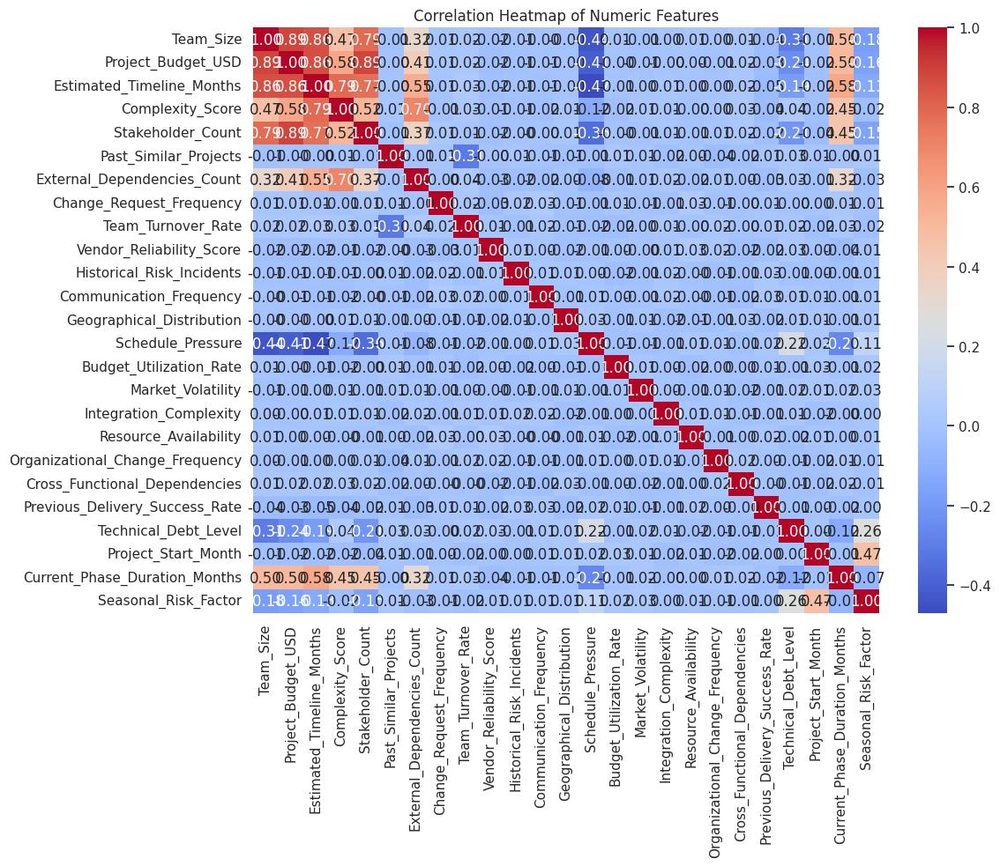

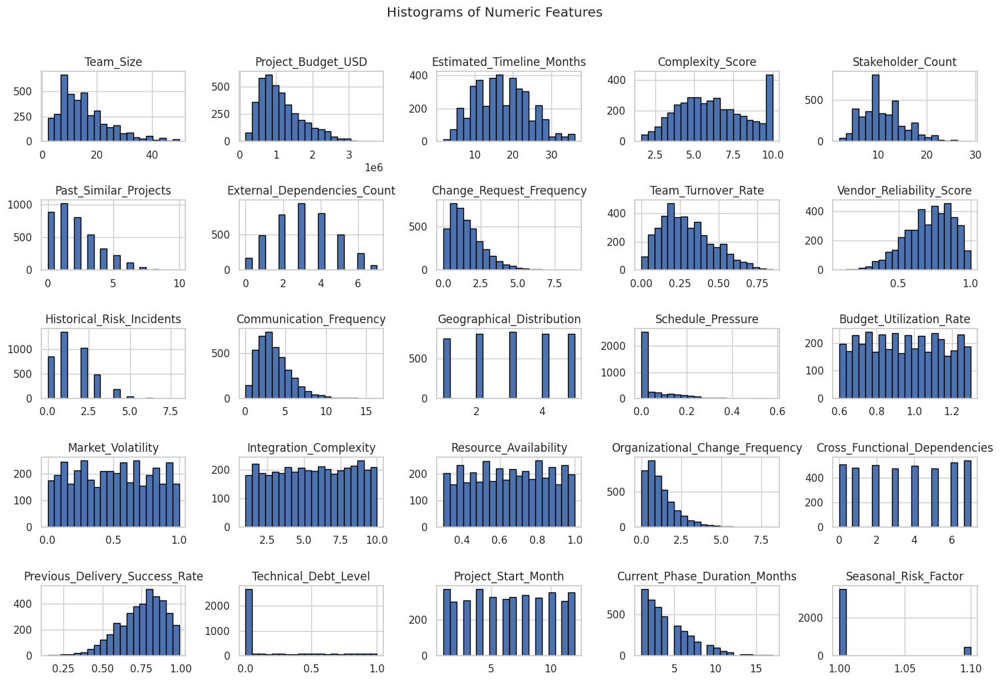

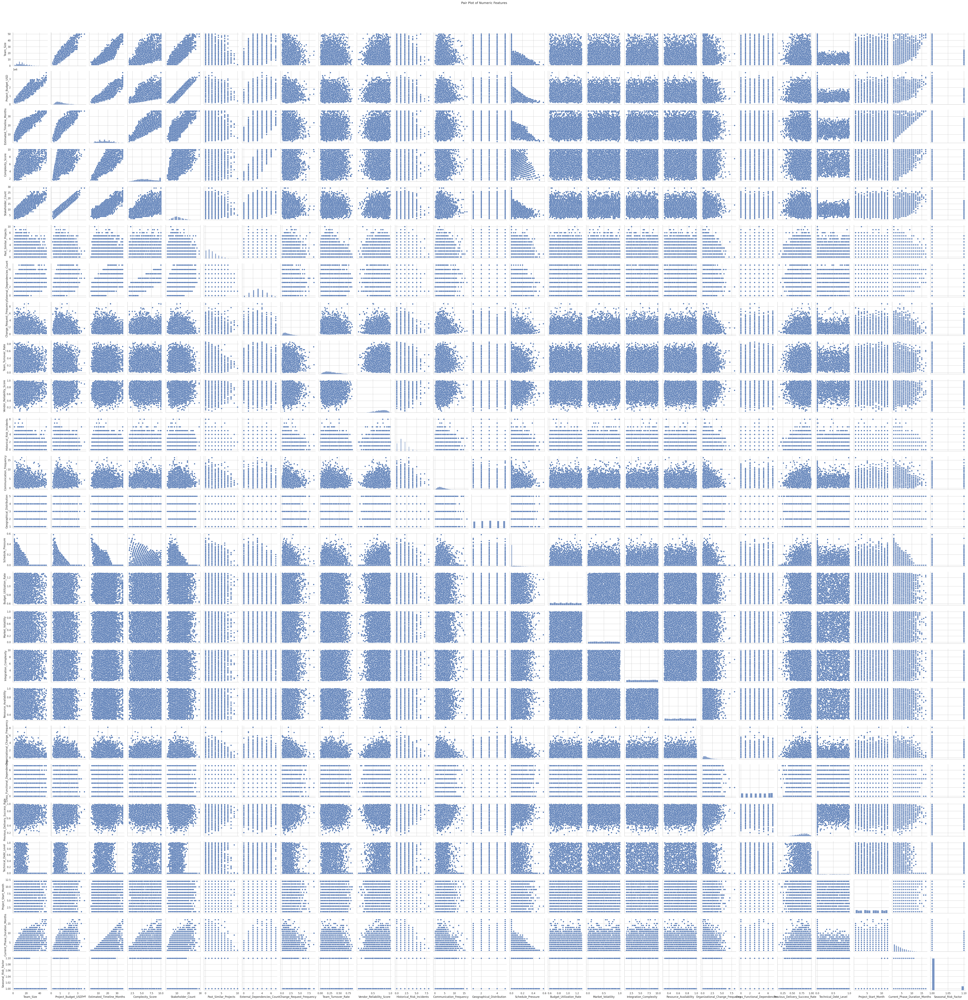

In [4]:
# EDA - Numeric Features
numeric_df = df.select_dtypes(include=[np.number])

print('Numeric columns:', list(numeric_df.columns))

# If there are four or more numeric columns, plot a correlation heatmap
if len(numeric_df.columns) >= 4:
    plt.figure(figsize=(12, 10))
    corr = numeric_df.corr()
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap of Numeric Features')
    plt.tight_layout()
    plt.show()
else:
    print('Not enough numeric columns for a correlation heatmap.')

# Histograms for numeric features
numeric_df.hist(figsize=(15, 10), bins=20, edgecolor='black')
plt.suptitle('Histograms of Numeric Features', y=1.02)
plt.tight_layout()
plt.show()

# Pair Plot (if enough variables)
if len(numeric_df.columns) >= 4:
    sns.pairplot(numeric_df)
    plt.suptitle('Pair Plot of Numeric Features', y=1.02)
    plt.show()
else:
    print('Not enough numeric columns for a pair plot.')

Categorical columns: ['Project_ID', 'Project_Type', 'Methodology_Used', 'Team_Experience_Level', 'Project_Phase', 'Requirement_Stability', 'Regulatory_Compliance_Level', 'Technology_Familiarity', 'Stakeholder_Engagement_Level', 'Executive_Sponsorship', 'Funding_Source', 'Priority_Level', 'Project_Manager_Experience', 'Org_Process_Maturity', 'Data_Security_Requirements', 'Key_Stakeholder_Availability', 'Tech_Environment_Stability', 'Contract_Type', 'Resource_Contention_Level', 'Industry_Volatility', 'Client_Experience_Level', 'Change_Control_Maturity', 'Risk_Management_Maturity', 'Team_Colocation', 'Documentation_Quality', 'Risk_Level']


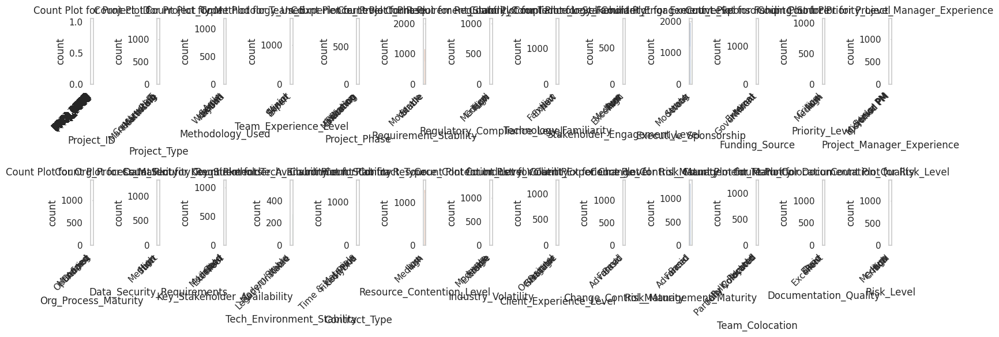

In [5]:
# EDA - Categorical Features
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
print('Categorical columns:', categorical_cols)

plt.figure(figsize=(15, 6))
for i, col in enumerate(categorical_cols, 1):
    plt.subplot(2, int(np.ceil(len(categorical_cols)/2)), i)
    # Using countplot as a pie chart alternative since seaborn pie chart is not available
    sns.countplot(data=df, x=col, order=df[col].value_counts().index)
    plt.xticks(rotation=45, ha='right')
    plt.title(f'Count Plot for {col}')
plt.tight_layout()
plt.show()

# Feature Engineering and Predictor

In many real-world projects, predicting the outcome can provide crucial leads to effective risk management. Here, we choose to predict the project's Risk Level. We will encode categorical values using one-hot encoding and split the data for training a classifier. For this example, a Random Forest classifier is used owing to its robustness, and we measure performance using the accuracy score. Moreover, a confusion matrix, ROC curves (for each class, if applicable), and permutation importance will help us grasp our model's strengths and pitfalls.

Note: If any of these steps generate errors (for example, related to missing values or encoding issues), these methods provide a robust baseline to debug and resolve the issues.

In [6]:
# Prepare data for prediction
# We will predict 'Risk_Level'. First, drop rows with missing target values if any
df_model = df.dropna(subset=['Risk_Level']).copy()

# Separate the target and features
target = 'Risk_Level'
X = df_model.drop(columns=[target, 'Project_ID'])  # Removing identifier column
y = df_model[target]

# Convert categorical features using one-hot encoding
X_encoded = pd.get_dummies(X, drop_first=True)

print('Shape after encoding:', X_encoded.shape)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.3, random_state=42, stratify=y)
print('Training set shape:', X_train.shape)
print('Testing set shape:', X_test.shape)

# Initialize and train a Random Forest classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)
print('Model training complete.')

Shape after encoding: (4000, 96)
Training set shape: (2800, 96)
Testing set shape: (1200, 96)
Model training complete.


Prediction Accuracy: 0.48


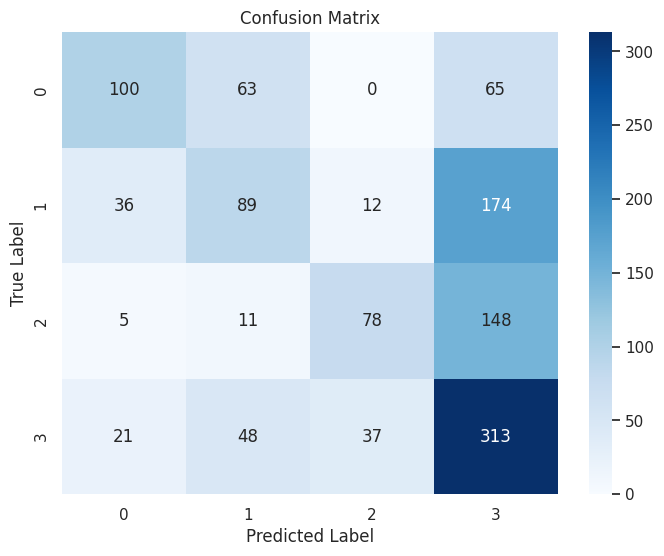

ROC curve plotting skipped for multiclass classification.


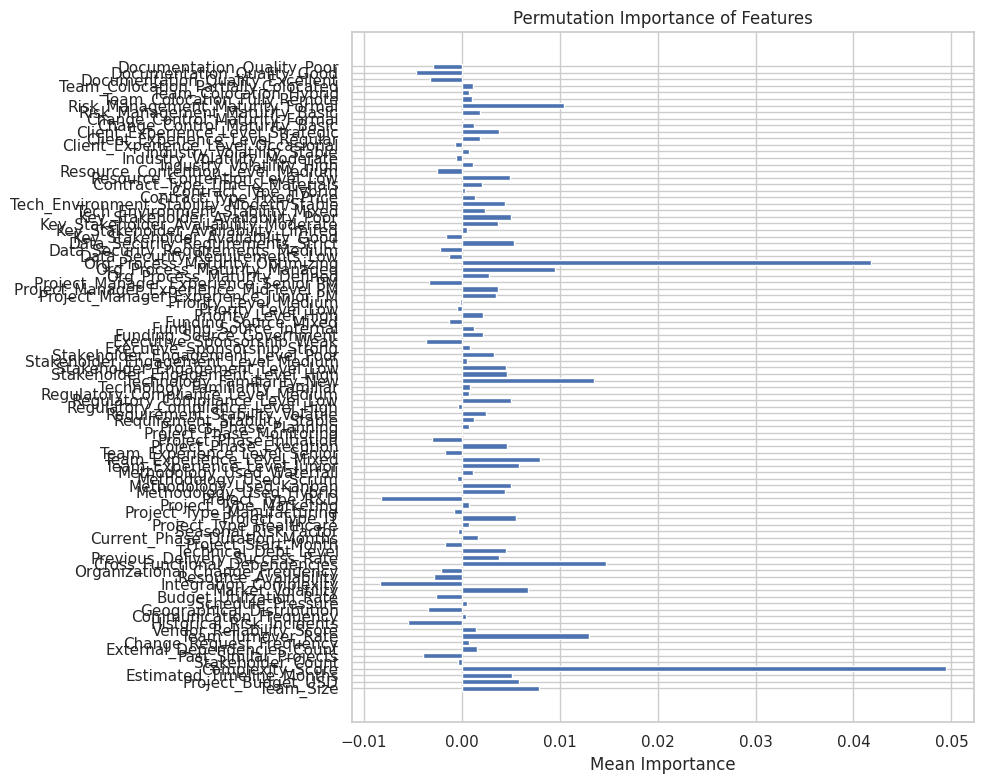

In [7]:
# Evaluate the predictor
acc = accuracy_score(y_test, y_pred)
print(f'Prediction Accuracy: {acc:.2f}')

# Generate the confusion matrix and display it using a heatmap
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# For a multi-class problem, ROC curves are a bit more involved. If there are only two classes, plot the ROC curve
if len(y.unique()) == 2:
    from sklearn.preprocessing import label_binarize
    y_test_bin = label_binarize(y_test, classes=y.unique())
    y_score = rf_model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test_bin, y_score)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], '--', color='gray')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()
else:
    print('ROC curve plotting skipped for multiclass classification.')

# Permutation Importance
result = permutation_importance(rf_model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=-1)
imp_values = result.importances_mean
features = X_encoded.columns

plt.figure(figsize=(10, 8))
plt.barh(features, imp_values)
plt.xlabel('Mean Importance')
plt.title('Permutation Importance of Features')
plt.tight_layout()
plt.show()

# Conclusion and Future Work

This notebook presented a comprehensive analysis of the project management risk dataset. We began with data loading and cleaning, followed by a range of exploratory visualizations, and finally developed a predictive model for Risk Level assessment. Our approach employed a Random Forest classifier, which offered a reasonable accuracy. In addition to accuracy, the confusion matrix and permutation importance provided insights into model performance and feature relevance.

Future analysis could further explore feature engineering, consider more sophisticated modeling techniques, or even perform time-series analyses if more detailed temporal data becomes available. Iterative model tuning and cross-validation are recommended to improve performance. If you found these insights useful, please consider upvoting this notebook.